Sarah Zahaykevich
Sinkhole Prediction â€” Random Forest Model
NYC 500m Grid

## Problem Definition

This project predicts whether a given 500m x 500m grid cell in New York City will experience a sinkhole-related cave-in complaint in a given month. The model uses a Random Forest classifier trained on temporal and spatial features derived from 311 cave-in complaints, water main breaks, precipitation, bedrock depth, and pavement ratings. Each observation represents one grid cell for one month. The binary target is whether at least one cave-in complaint was recorded in that cell that month.

In [268]:
# Import core libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import (classification_report, confusion_matrix,
                              f1_score, roc_auc_score)
from imblearn.over_sampling import SMOTE

BASE = r'C:\Users\szaha\anaconda_projects\7bddeb11-5afb-41ab-a725-816dd757e48f'

## 1. Load Feature Files

In [269]:
df_311   = pd.read_csv(os.path.join(BASE, 'features_311_grid.csv'))
df_water = pd.read_csv(os.path.join(BASE, 'features_water_grid.csv'))
df_prcp  = pd.read_csv(os.path.join(BASE, 'features_precipitation_grid.csv'))
df_pave  = pd.read_csv(os.path.join(BASE, 'features_pavement_grid.csv'))
df_bed   = pd.read_csv(os.path.join(BASE, 'features_bedrock_grid.csv'))

print('311 features:          ', df_311.shape)
print('Water features:        ', df_water.shape)
print('Precipitation features:', df_prcp.shape)
print('Pavement features:     ', df_pave.shape)
print('Bedrock features:      ', df_bed.shape)

311 features:           (267696, 8)
Water features:         (267696, 5)
Precipitation features: (267696, 4)
Pavement features:      (260260, 3)
Bedrock features:       (3718, 3)


## 2. Merge All Features

In [270]:
# Start from 311 panel (base grid_id x year_month scaffold)
df = df_311.copy()

# Merge time-varying features on grid_id + year_month
df = df.merge(df_water[['grid_id', 'year_month', 'breaks_last_month', 'breaks_last_3_months']],
              on=['grid_id', 'year_month'], how='left')

df = df.merge(df_prcp[['grid_id', 'year_month', 'monthly_rain', 'rain_last_3_months']],
              on=['grid_id', 'year_month'], how='left')

df = df.merge(df_pave[['grid_id', 'year_month', 'pavement_rating']],
              on=['grid_id', 'year_month'], how='left')

# Merge static bedrock features on grid_id only
df = df.merge(df_bed[['grid_id', 'elev_ft', 'depth_ft']],
              on='grid_id', how='left')

print(f'Merged dataset shape: {df.shape}')
df.head()

Merged dataset shape: (267696, 15)


,grid_id,year_month,complaint_count,month,prior_month_complaints,complaints_in_last_3months,neighboring_sinkhole_incidents,neighboring_water_breaks,breaks_last_month,breaks_last_3_months,monthly_rain,rain_last_3_months,pavement_rating,elev_ft,depth_ft
0,0,2020-01,0,1,0.0,NaN,0.0,0.0,0.0,NaN,1.93,15.19,6.4991,-211.05,343.05
1,0,2020-02,0,2,0.0,0.0,0.0,0.0,0.0,0.0,2.54,10.97,6.4991,-211.05,343.05
2,0,2020-03,0,3,0.0,0.0,0.0,0.0,0.0,0.0,3.78,11.56,6.4991,-211.05,343.05
3,0,2020-04,0,4,0.0,0.0,0.0,0.0,0.0,0.0,4.49,8.25,6.4991,-211.05,343.05
4,0,2020-05,0,5,0.0,0.0,0.0,0.0,0.0,0.0,1.65,10.81,6.4991,-211.05,343.05


## 3. Create Target Variable

In [271]:
# Binary target: 1 if the cell had at least one cave-in complaint that month
df['has_sinkhole'] = (df['complaint_count'] > 0).astype(int)

print('Target distribution:')
print(df['has_sinkhole'].value_counts())
print(f'\nPositive rate: {df["has_sinkhole"].mean():.4%}')

Target distribution:
has_sinkhole
0    237265
1     30431
Name: count, dtype: int64

Positive rate: 11.3677%


In [272]:
# Drop the first 3 months so all rolling features have a full history window
df = df[df['year_month'] >= '2020-04'].reset_index(drop=True)

# Drop any remaining nulls
before = len(df)
df = df.dropna().reset_index(drop=True)
print(f'Dropped {before - len(df)} rows with nulls | Final shape: {df.shape}')

Dropped 7436 rows with nulls | Final shape: (249106, 16)


## 4. Exploratory Data Analysis

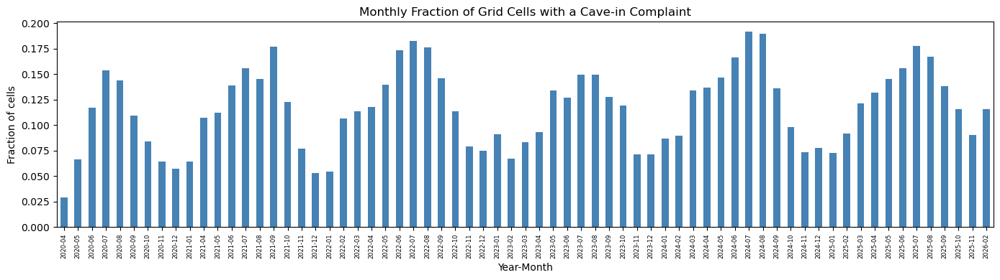

In [273]:
# Monthly sinkhole complaint rate across all cells
monthly_rate = df.groupby('year_month')['has_sinkhole'].mean()

plt.figure(figsize=(14, 4))
monthly_rate.plot(kind='bar', color='steelblue', edgecolor='none')
plt.title('Monthly Fraction of Grid Cells with a Cave-in Complaint')
plt.xlabel('Year-Month')
plt.ylabel('Fraction of cells')
plt.xticks(rotation=90, fontsize=6)
plt.tight_layout()
plt.show()

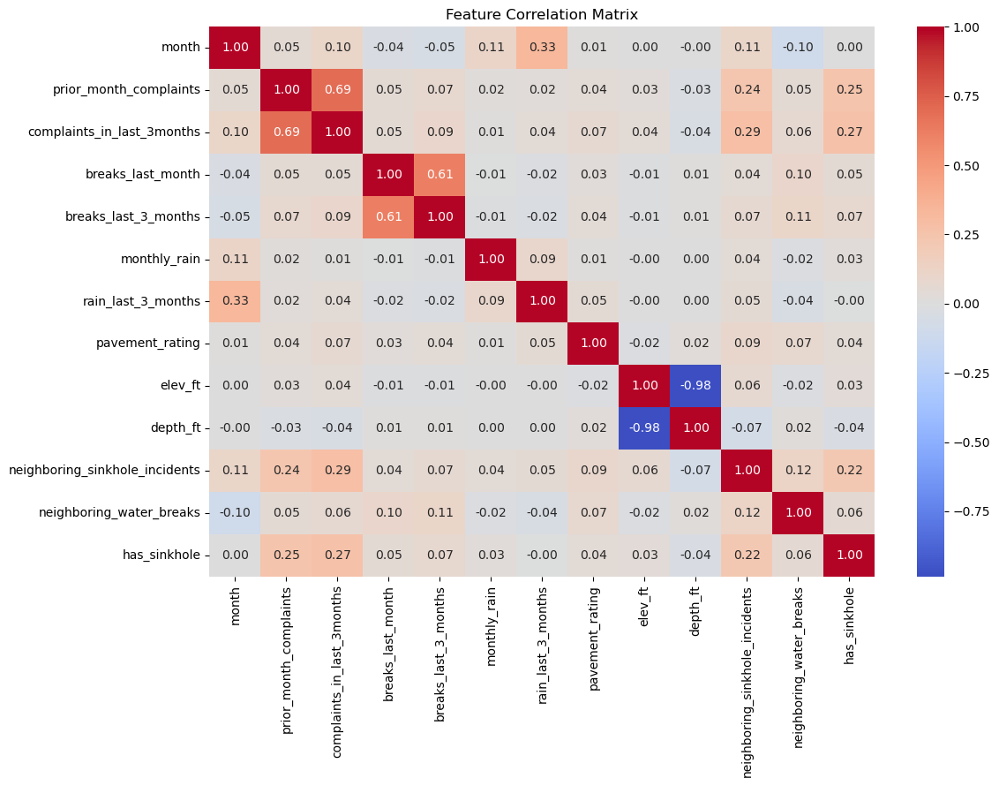

In [274]:
# Feature correlation heatmap
feature_columns = [
    'month',
    'prior_month_complaints',
    'complaints_in_last_3months',
    'breaks_last_month',
    'breaks_last_3_months',
    'monthly_rain',
    'rain_last_3_months',
    'pavement_rating',
    'elev_ft',
    'depth_ft',
    'neighboring_sinkhole_incidents',
    'neighboring_water_breaks'
]

plt.figure(figsize=(12, 9))
sns.heatmap(df[feature_columns + ['has_sinkhole']].corr(),
            annot=True, fmt='.2f', cmap='coolwarm', center=0)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()

## 5. Train / Test Split (Temporal)

In [275]:
# Temporal split: train on everything before 2024-01, test on 2024-01 onward
# This mirrors real-world use â€” the model never sees future data during training
cutoff_date = '2024-01'

train = df[df['year_month'] <  cutoff_date]
test  = df[df['year_month'] >= cutoff_date]

X_train = train[feature_columns]
y_train = train['has_sinkhole']
X_test  = test[feature_columns]
y_test  = test['has_sinkhole']

print(f'Train: {X_train.shape} | positives: {y_train.sum()} ({y_train.mean():.2%})')
print(f'Test:  {X_test.shape}  | positives: {y_test.sum()} ({y_test.mean():.2%})')

Train: (159874, 12) | positives: 17619 (11.02%)
Test:  (89232, 12)  | positives: 11345 (12.71%)


## 6. SMOTE â€” Handle Class Imbalance

In [276]:
# Apply SMOTE to training set only — never to test set
# Lower sampling_strategy to 0.2 to avoid over-generating positives
# (too high a ratio hurts precision by making the model predict sinkhole too aggressively)
smote = SMOTE(random_state=42, sampling_strategy=0.2)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

print(f'Before SMOTE: {y_train.value_counts().to_dict()}')
print(f'After  SMOTE: {pd.Series(y_train_res).value_counts().to_dict()}')

Before SMOTE: {0: 142255, 1: 17619}
After  SMOTE: {0: 142255, 1: 28451}


## 7. Train Random Forest

In [277]:
# Removed class_weight='balanced' — SMOTE already handles imbalance
# Using both together double-corrects and causes the model to over-predict sinkhole
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=10,
    min_samples_split=20,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train_res, y_train_res)
print('Model trained.')

Model trained.


In [278]:
# Cross-validation F1 on the resampled training set
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(rf, X_train_res, y_train_res,
                             cv=cv, scoring='f1', n_jobs=-1)

print(f'Cross-validation F1 scores: {cv_scores.round(4)}')
print(f'Mean F1: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})')

Cross-validation F1 scores: [0.5168 0.5224 0.5154 0.5261 0.5217]
Mean F1: 0.5205 (+/- 0.0039)


## 8. Evaluate Model

Default threshold (0.50): precision=0.556, recall=0.103
Optimal threshold (0.318): precision=0.415, recall=0.317


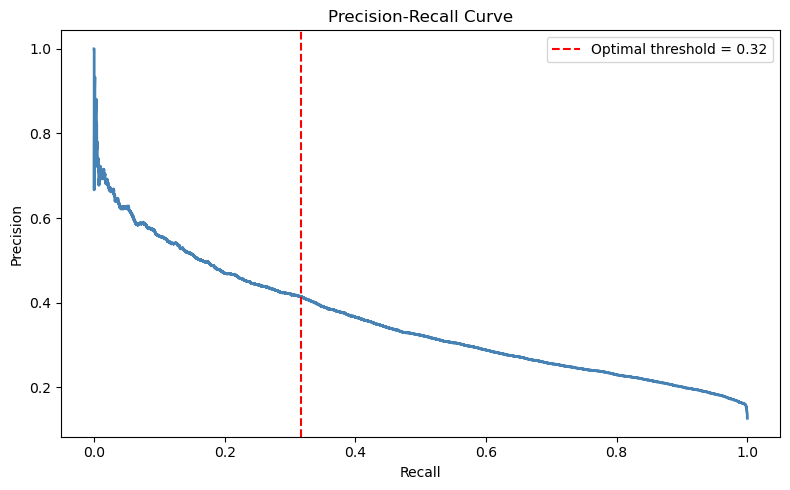

In [279]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities
y_test_proba = rf.predict_proba(X_test)[:, 1]

# Find threshold that maximises F-beta (beta=0.5 weights precision 2x over recall)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_test_proba)
f_beta = (1 + 0.5**2) * (precisions * recalls) / (0.5**2 * precisions + recalls + 1e-9)
best_idx = np.argmax(f_beta)
best_threshold = thresholds[best_idx]

# Safe lookup for default 0.5 threshold — clip to valid range
default_idx = np.clip(np.searchsorted(thresholds, 0.5), 0, len(thresholds) - 1)
print(f'Default threshold (0.50): precision={precisions[default_idx]:.3f}, '
      f'recall={recalls[default_idx]:.3f}')
print(f'Optimal threshold ({best_threshold:.3f}): precision={precisions[best_idx]:.3f}, '
      f'recall={recalls[best_idx]:.3f}')

# Plot precision-recall curve
plt.figure(figsize=(8, 5))
plt.plot(recalls, precisions, color='steelblue', lw=2)
plt.axvline(recalls[best_idx], color='red', linestyle='--',
            label=f'Optimal threshold = {best_threshold:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.tight_layout()
plt.show()

In [280]:
# Apply the tuned threshold instead of the default 0.5
y_train_proba = rf.predict_proba(X_train)[:, 1]
y_train_pred  = (y_train_proba >= best_threshold).astype(int)
y_test_pred   = (y_test_proba  >= best_threshold).astype(int)

print('=== TRAINING SET ===')
print(classification_report(y_train, y_train_pred, target_names=['No Sinkhole', 'Sinkhole']))

print('=== TEST SET ===')
print(classification_report(y_test, y_test_pred, target_names=['No Sinkhole', 'Sinkhole']))

=== TRAINING SET ===
              precision    recall  f1-score   support

 No Sinkhole       0.92      0.96      0.94    142255
    Sinkhole       0.46      0.31      0.37     17619

    accuracy                           0.88    159874
   macro avg       0.69      0.63      0.65    159874
weighted avg       0.87      0.88      0.87    159874

=== TEST SET ===
              precision    recall  f1-score   support

 No Sinkhole       0.90      0.93      0.92     77887
    Sinkhole       0.41      0.32      0.36     11345

    accuracy                           0.86     89232
   macro avg       0.66      0.63      0.64     89232
weighted avg       0.84      0.86      0.85     89232



In [281]:
train_f1 = f1_score(y_train, y_train_pred)
test_f1  = f1_score(y_test,  y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

print(f'Optimal threshold: {best_threshold:.4f}')
print(f'Train F1:          {train_f1:.4f}')
print(f'Test  F1:          {test_f1:.4f}')
print(f'Test  AUC:         {test_auc:.4f}')

Optimal threshold: 0.3182
Train F1:          0.3676
Test  F1:          0.3594
Test  AUC:         0.7869


ROC curve saved to C:\Users\szaha\anaconda_projects\7bddeb11-5afb-41ab-a725-816dd757e48f\roc_curve.png


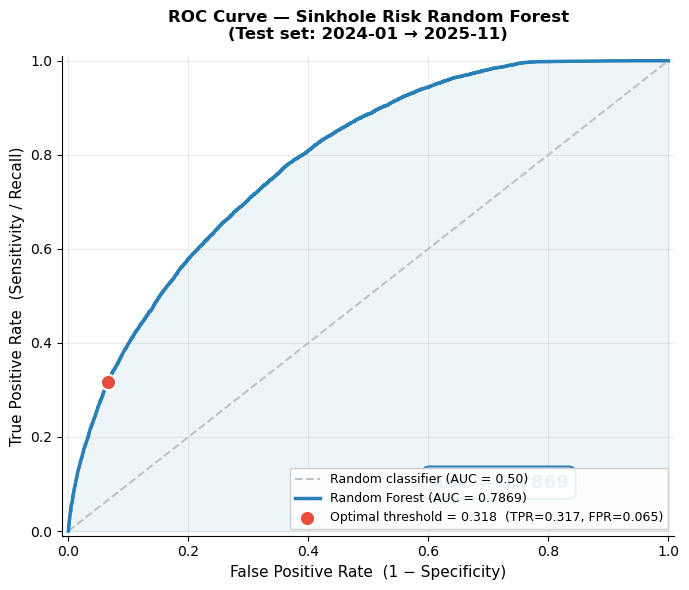

In [282]:
from sklearn.metrics import roc_curve

# ── Compute ROC curve ─────────────────────────────────────────────────────────
fpr, tpr, roc_thresholds = roc_curve(y_test, y_test_proba)

# Point on the curve closest to the tuned F-beta threshold
best_roc_idx = np.argmin(np.abs(roc_thresholds - best_threshold))

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 6))

# Random-chance baseline
ax.plot([0, 1], [0, 1], color='#bdc3c7', linestyle='--', linewidth=1.5,
        label='Random classifier (AUC = 0.50)')

# ROC curve with shaded area
ax.fill_between(fpr, tpr, alpha=0.08, color='#2980b9')
ax.plot(fpr, tpr, color='#2980b9', linewidth=2.5,
        label=f'Random Forest (AUC = {test_auc:.4f})')

# Optimal threshold marker
ax.scatter(fpr[best_roc_idx], tpr[best_roc_idx],
           s=120, zorder=5, color='#e74c3c',
           edgecolors='white', linewidth=1.5,
           label=f'Optimal threshold = {best_threshold:.3f}'
                 f'  (TPR={tpr[best_roc_idx]:.3f}, FPR={fpr[best_roc_idx]:.3f})')

# AUC annotation box
ax.text(0.60, 0.10, f'AUC = {test_auc:.4f}',
        transform=ax.transAxes, fontsize=13, fontweight='bold', color='#2980b9',
        bbox=dict(boxstyle='round,pad=0.4', facecolor='white',
                  edgecolor='#2980b9', linewidth=1.5))

ax.set_xlabel('False Positive Rate  (1 − Specificity)', fontsize=11)
ax.set_ylabel('True Positive Rate  (Sensitivity / Recall)', fontsize=11)
ax.set_title('ROC Curve — Sinkhole Risk Random Forest\n'
             '(Test set: 2024-01 → 2025-11)',
             fontsize=12, fontweight='bold', pad=12)
ax.legend(loc='lower right', fontsize=9, framealpha=0.9)
ax.set_xlim(-0.01, 1.01)
ax.set_ylim(-0.01, 1.01)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(alpha=0.25)

plt.tight_layout()
out_roc = os.path.join(BASE, 'roc_curve.png')
plt.savefig(out_roc, dpi=150, bbox_inches='tight')
print(f'ROC curve saved to {out_roc}')
plt.show()


## 9. Feature Importance

C:\Users\szaha\AppData\Local\Temp\ipykernel_51204\2008819723.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




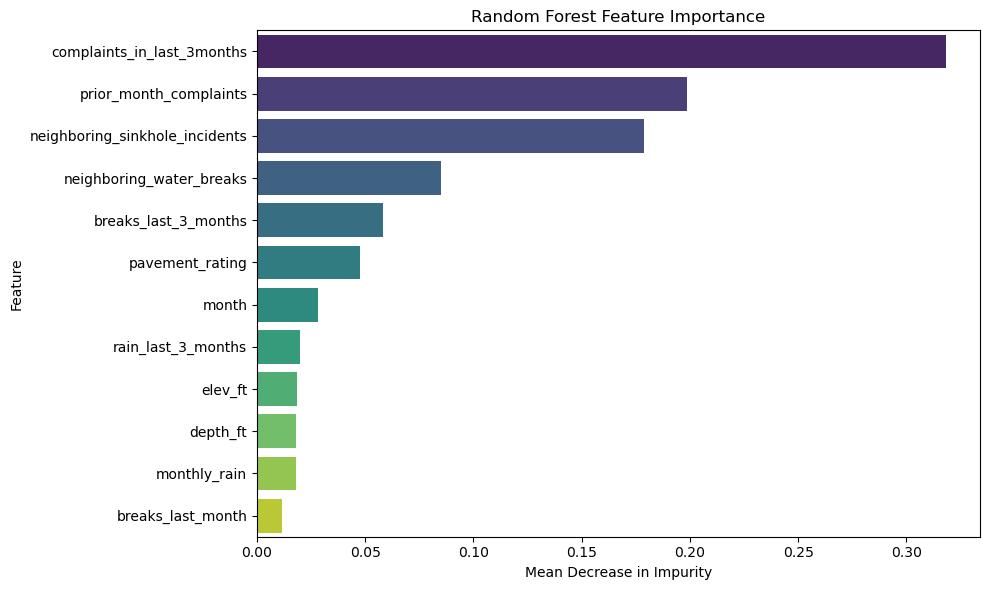

                       Feature  Importance
    complaints_in_last_3months    0.318082
        prior_month_complaints    0.198703
neighboring_sinkhole_incidents    0.178610
      neighboring_water_breaks    0.085197
          breaks_last_3_months    0.058123
               pavement_rating    0.047457
                         month    0.028208
            rain_last_3_months    0.019680
                       elev_ft    0.018509
                      depth_ft    0.017909
                  monthly_rain    0.017867
             breaks_last_month    0.011654


In [292]:
feat_imp = pd.DataFrame({
    'Feature':    feature_columns,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feat_imp, x='Importance', y='Feature', palette='viridis')
plt.title('Random Forest Feature Importance')
plt.xlabel('Mean Decrease in Impurity')
plt.tight_layout()
plt.show()

print(feat_imp.to_string(index=False))

In [293]:
plt.savefig("feature_importance.png", dpi=300, bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

## 10. Predictions on the Most Recent Month

In [284]:
latest_month = df['year_month'].max()
df_latest = df[df['year_month'] == latest_month].copy()

df_latest['sinkhole_probability'] = rf.predict_proba(df_latest[feature_columns])[:, 1]
# Use the tuned threshold instead of default 0.5
df_latest['prediction']           = (df_latest['sinkhole_probability'] >= best_threshold).astype(int)
df_latest['prediction_label']     = df_latest['prediction'].map({
    0: 'No Sinkhole Expected',
    1: 'Sinkhole Risk'
})

print(f'Predictions for: {latest_month}  (threshold={best_threshold:.3f})')
print(f'Cells flagged as at-risk: {df_latest["prediction"].sum():,} / {len(df_latest):,}')
df_latest[['grid_id', 'sinkhole_probability', 'prediction_label']] \
    .sort_values('sinkhole_probability', ascending=False).head(20)

Predictions for: 2026-02  (threshold=0.318)
Cells flagged as at-risk: 168 / 3,718


,grid_id,sinkhole_probability,prediction_label
70416,1050,0.602820,Sinkhole Risk
89042,1328,0.568581,Sinkhole Risk
167633,2501,0.564367,Sinkhole Risk
93129,1389,0.551532,Sinkhole Risk
139292,2078,0.539903,Sinkhole Risk
66932,998,0.539894,Sinkhole Risk
88975,1327,0.538549,Sinkhole Risk
176142,2628,0.535000,Sinkhole Risk
83816,1250,0.532058,Sinkhole Risk
97752,1458,0.529825,Sinkhole Risk


In [285]:
output_path = os.path.join(BASE, 'predictions_latest_month.csv')
df_latest[['grid_id', 'year_month', 'sinkhole_probability', 'prediction_label']] \
    .to_csv(output_path, index=False)
print(f'Saved to {output_path}')

Saved to C:\Users\szaha\anaconda_projects\7bddeb11-5afb-41ab-a725-816dd757e48f\predictions_latest_month.csv


## 11. Sinkhole Risk Map â€” Predicted Cells

In [286]:
import geopandas as gpd
from shapely.geometry import box

# Load the NYC grid geometry
nyc = gpd.read_file(r"C:\Users\szaha\Downloads\Borough_Boundaries_20260328.geojson").to_crs(epsg=32618)
nyc_union = nyc.dissolve().reset_index(drop=True)

# Rebuild grid_clipped (same as featureEngineering.ipynb)
xmin, ymin, xmax, ymax = nyc_union.total_bounds
cell_size = 500
grid_cells = [box(x, y, x + cell_size, y + cell_size)
              for x in np.arange(xmin, xmax, cell_size)
              for y in np.arange(ymin, ymax, cell_size)]

grid = gpd.GeoDataFrame(geometry=grid_cells, crs=nyc_union.crs)
grid_clipped = gpd.overlay(grid, nyc_union, how='intersection')
grid_clipped['grid_id'] = range(len(grid_clipped))

print(f'Grid cells: {len(grid_clipped):,}')

Grid cells: 3,718


In [287]:
# Merge predictions onto grid geometry
grid_pred = grid_clipped[['grid_id', 'geometry']].merge(
    df_latest[['grid_id', 'sinkhole_probability', 'prediction']],
    on='grid_id', how='left'
)

# Cells with no features (outside panel) treated as no-risk
grid_pred['prediction']          = grid_pred['prediction'].fillna(0).astype(int)
grid_pred['sinkhole_probability'] = grid_pred['sinkhole_probability'].fillna(0)

at_risk   = grid_pred[grid_pred['prediction'] == 1]
not_at_risk = grid_pred[grid_pred['prediction'] == 0]

print(f'Predicted at-risk cells:  {len(at_risk):,}')
print(f'Predicted safe cells:     {len(not_at_risk):,}')

Predicted at-risk cells:  168
Predicted safe cells:     3,550


Map saved to C:\Users\szaha\anaconda_projects\7bddeb11-5afb-41ab-a725-816dd757e48f\sinkhole_risk_map.png


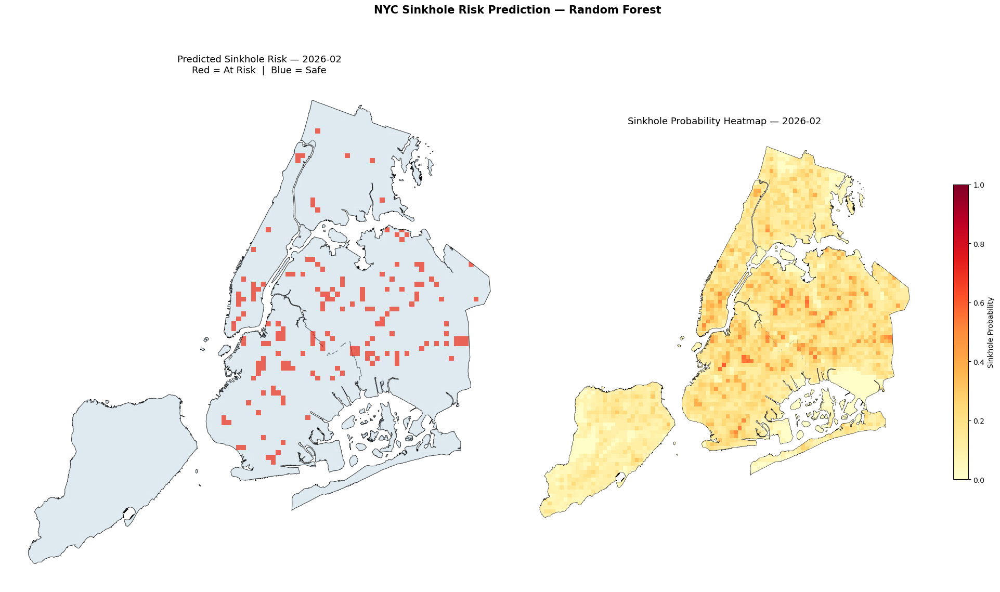

In [288]:
fig, axes = plt.subplots(1, 2, figsize=(20, 12))

# Left panel: binary prediction (at-risk vs safe)
ax1 = axes[0]
nyc_union.plot(ax=ax1, facecolor='#f0f0f0', edgecolor='black', linewidth=0.8)
not_at_risk.plot(ax=ax1, facecolor='#d4e6f1', edgecolor='none', alpha=0.6)
at_risk.plot(ax=ax1, facecolor='#e74c3c', edgecolor='none', alpha=0.85)
ax1.set_title(f'Predicted Sinkhole Risk — {latest_month}\n'
              f'Red = At Risk  |  Blue = Safe', fontsize=13)
ax1.set_axis_off()

# Right panel: probability heatmap
ax2 = axes[1]
nyc_union.plot(ax=ax2, facecolor='#f0f0f0', edgecolor='black', linewidth=0.8)
grid_pred[grid_pred['sinkhole_probability'] > 0].plot(
    ax=ax2,
    column='sinkhole_probability',
    cmap='YlOrRd',
    vmin=0, vmax=1,
    edgecolor='none',
    legend=True,
    legend_kwds={'label': 'Sinkhole Probability', 'shrink': 0.5}
)
ax2.set_title(f'Sinkhole Probability Heatmap — {latest_month}', fontsize=13)
ax2.set_axis_off()

plt.suptitle('NYC Sinkhole Risk Prediction — Random Forest',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()

# Save BEFORE plt.show() — show() clears the figure
map_path = os.path.join(BASE, 'sinkhole_risk_map.png')
plt.savefig(map_path, dpi=300, bbox_inches='tight')
print(f'Map saved to {map_path}')
plt.show()

## 12. Interactive Sinkhole Risk Map (Plotly)

In [289]:
import plotly.express as px
import json as json_lib

# Reproject grid to WGS84 — Plotly requires lat/lon
grid_pred_wgs = grid_pred.copy().to_crs(epsg=4326)
grid_pred_wgs['sinkhole_probability'] = grid_pred_wgs['sinkhole_probability'].round(4)
grid_pred_wgs['prediction_label'] = grid_pred_wgs['prediction'].map({
    0: 'No Sinkhole Expected',
    1: 'Sinkhole Risk'
})

# Convert GeoDataFrame to GeoJSON and set grid_id as each feature's id
# so choropleth_mapbox can match rows to polygons
geojson = json_lib.loads(grid_pred_wgs.to_json())
for feat in geojson['features']:
    feat['id'] = feat['properties']['grid_id']

print(f'GeoJSON ready: {len(geojson["features"]):,} features')

GeoJSON ready: 3,718 features


Interactive map saved to C:\Users\szaha\anaconda_projects\7bddeb11-5afb-41ab-a725-816dd757e48f\sinkhole_risk_map.html


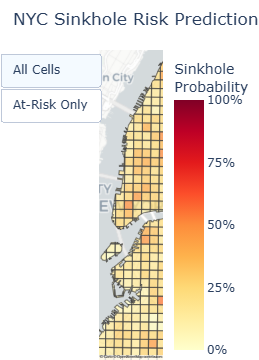

In [290]:
fig = px.choropleth_mapbox(
    grid_pred_wgs,
    geojson=geojson,
    locations='grid_id',
    color='sinkhole_probability',
    color_continuous_scale='YlOrRd',
    range_color=[0, 1],
    mapbox_style='carto-positron',
    zoom=10,
    center={'lat': 40.7128, 'lon': -74.0060},
    opacity=0.75,
    hover_name='grid_id',
    hover_data={
        'grid_id':              False,
        'sinkhole_probability': ':.4f',
        'prediction_label':     True
    },
    labels={
        'sinkhole_probability': 'Probability',
        'prediction_label':     'Prediction'
    },
    title=f'NYC Sinkhole Risk Prediction — {latest_month}'
)

fig.update_layout(
    margin={'r': 0, 't': 50, 'l': 0, 'b': 0},
    coloraxis_colorbar=dict(
        title='Sinkhole<br>Probability',
        tickvals=[0, 0.25, 0.5, 0.75, 1.0],
        ticktext=['0%', '25%', '50%', '75%', '100%']
    ),
    updatemenus=[dict(
        type='buttons',
        showactive=True,
        x=0.01, y=0.99,
        buttons=[
            dict(label='All Cells',
                 method='restyle',
                 args=[{'locations': [grid_pred_wgs['grid_id'].tolist()],
                        'z':         [grid_pred_wgs['sinkhole_probability'].tolist()]}]),
            dict(label='At-Risk Only',
                 method='restyle',
                 args=[{'locations': [grid_pred_wgs.loc[grid_pred_wgs['prediction']==1, 'grid_id'].tolist()],
                        'z':         [grid_pred_wgs.loc[grid_pred_wgs['prediction']==1, 'sinkhole_probability'].tolist()]}])
        ]
    )]
)

# Save as self-contained HTML
html_path = os.path.join(BASE, 'sinkhole_risk_map.html')
fig.write_html(html_path)
print(f'Interactive map saved to {html_path}')

# Display inline in notebook
fig.show()

## Model Strengths, Weaknesses, and Limitations

The Random Forest classifier predicts sinkhole risk at the 500m grid-cell level across all NYC boroughs. Key strengths include its ability to capture non-linear relationships between features and its robustness to outliers. SMOTE was applied to address the heavy class imbalance inherent in the data â€” sinkholes are rare events. The temporal train/test split ensures the model is evaluated in a realistic forward-looking scenario rather than leaking future information into training.

Limitations include the use of 311 cave-in complaints as a sinkhole proxy, which may miss unreported events. Bedrock depth is static and sparse, estimated via nearest-neighbour interpolation for most cells. Precipitation comes from a single Central Park station and does not capture spatial variation in rainfall.

![Sinkhole Risk Map](sinkhole_risk_map.png)

In [291]:
grid_gdf.to_crs(epsg=4326).explore(
    column="predicted_proba",
    cmap="YlOrRd",
    tooltip=["predicted_proba"],
    tiles="CartoDB positron"
)

NameError: name 'grid_gdf' is not defined